In [1]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 17.6 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


# Import Libraries

In [2]:
import os
import tempfile
import numpy as np
import torch
from huggingface_hub import hf_api, HfApi, snapshot_download
from torchvision import transforms
import PIL
from PIL import Image
from functools import partial
import hashlib
from typing import Callable, List, Optional, Union, Any, Dict, Tuple
import copy
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer
from diffusers import DPMSolverMultistepScheduler, DiffusionPipeline, DDIMScheduler, DDIMInverseScheduler
from diffusers import StableDiffusionPipeline
from diffusers.utils import logging, BaseOutput
from diffusers.models import AutoencoderKL, UNet2DConditionModel
from diffusers.pipelines.stable_diffusion.safety_checker import StableDiffusionSafetyChecker
from diffusers.schedulers import DDIMScheduler,PNDMScheduler, LMSDiscreteScheduler
import requests
from io import BytesIO
from datasets import load_dataset
from tqdm import tqdm

In [3]:
api = hf_api.HfApi()

In [ ]:
FILES_DIR = '/content/Files'
os.makedirs(FILES_DIR, exist_ok=True)

In [5]:
ORG_FILE_PATH = os.path.join(FILES_DIR, 'current_org.txt')

def set_org(org: str):
    os.makedirs(FILES_DIR, exist_ok=True)
    with open(ORG_FILE_PATH, 'w') as file:
        file.write(org)

def get_org() -> str:
    if not os.path.isfile(ORG_FILE_PATH):
        raise ValueError(f"{ORG_FILE_PATH} does not exist. Make sure to run `set_org(org)` first.")
    with open(ORG_FILE_PATH, 'r') as file:
        return file.read().strip()


In [ ]:
set_org("stabilityai")
print("Organization:", get_org())

Organization: stabilityai


# Functions

In [7]:
def _get_pattern(shape, w_pattern='ring', generator=None):
    gt_init = torch.randn(shape, generator=generator)

    if 'rand' in w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2))
        gt_patch[:] = gt_patch[0]
    elif 'zeros' in w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2)) * 0
    elif 'ring' in w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2))

        gt_patch_tmp = gt_patch.clone().detach()
        for i in range(shape[-1] // 2, 0, -1):
            tmp_mask = _circle_mask(gt_init.shape[-1], r=i)
            tmp_mask = torch.tensor(tmp_mask)

            for j in range(gt_patch.shape[1]):
                gt_patch[:, j, tmp_mask] = gt_patch_tmp[0, j, 0, i].item()

    return gt_patch


In [ ]:
def _circle_mask(size=64, r=10, x_offset=0, y_offset=0):
    x0 = y0 = size // 2
    x0 += x_offset
    y0 += y_offset
    y, x = np.ogrid[:size, :size]
    y = y[::-1]

    return ((x - x0)**2 + (y-y0)**2)<= r**2

In [ ]:
def _transform_img(image, target_size=512):
    tform = transforms.Compose(
        [
            transforms.Resize(target_size),
            transforms.CenterCrop(target_size),
            transforms.ToTensor(),
        ]
    )
    image = tform(image)
    return 2.0 * image - 1.0


def load_keys(cache_dir):
    arrays = {}

    for file_name in os.listdir(cache_dir):
        if file_name.endswith('.npy'):
            file_path = os.path.join(cache_dir, file_name)
            arrays[file_name] = np.load(file_path)

    return arrays

In [ ]:
def get_noise(
    shape: Union[torch.Size, List, Tuple], model_hash: str, generator=None
) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
    w_channel = 0
    w_radius = 10
    w_pattern = 'ring'

    np_mask = _circle_mask(shape[-1], r=w_radius)
    torch_mask = torch.tensor(np_mask)
    w_mask = torch.zeros(shape, dtype=torch.bool)
    w_mask[:, w_channel] = torch_mask

    w_key = _get_pattern(shape, w_pattern=w_pattern, generator=generator)

    init_latents = torch.randn(shape, generator=generator)

    init_latents_fft = torch.fft.fftshift(torch.fft.fft2(init_latents), dim=(-1, -2))
    init_latents_fft[w_mask] = w_key[w_mask].clone()
    init_latents = torch.fft.ifft2(torch.fft.ifftshift(init_latents_fft, dim=(-1, -2))).real

    tensor_bytes = init_latents.numpy().tobytes()
    hash_object = hashlib.sha256(tensor_bytes)
    hex_dig = hash_object.hexdigest()

    os.makedirs(FILES_DIR, exist_ok=True)
    file_name = "_".join([hex_dig, str(w_channel), str(w_radius), w_pattern]) + ".npy"
    file_path = os.path.join(FILES_DIR, file_name)
    np.save(file_path, w_key)

    print(f"Watermark key saved to: {file_path}")
    return init_latents, w_key, w_mask, init_latents_fft


In [ ]:
def detect(image: Union[PIL.Image.Image, torch.Tensor, np.ndarray], pipe, model_hash: str):
    detection_time_num_inference = 50
    threshold = 70

    keys = {}
    for file_name in os.listdir(FILES_DIR):
        if file_name.endswith(".npy"):
            file_path = os.path.join(FILES_DIR, file_name)
            keys[file_name] = np.load(file_path)

    curr_scheduler = pipe.scheduler
    pipe.scheduler = DDIMInverseScheduler.from_config(pipe.scheduler.config)

    img = _transform_img(image).unsqueeze(0).to(pipe.unet.dtype).to(pipe.device)
    image_latents = pipe.vae.encode(img).latent_dist.mode() * 0.18215

    inverted_latents = pipe(
        prompt='',
        latents=image_latents,
        guidance_scale=1,
        num_inference_steps=detection_time_num_inference,
        output_type='latent',
    )
    inverted_latents = inverted_latents.images.float().cpu()

    min_dist = float("inf")
    shape = image_latents.shape
    for filename, w_key in keys.items():
        w_channel, w_radius = filename.split(".npy")[0].split("_")[1:3]

        np_mask = _circle_mask(shape[-1], r=int(w_radius))
        torch_mask = torch.tensor(np_mask)
        w_mask = torch.zeros(shape, dtype=torch.bool)
        w_mask[:, int(w_channel)] = torch_mask

        inverted_latents_fft = torch.fft.fftshift(torch.fft.fft2(inverted_latents), dim=(-1, -2))
        dist = torch.abs(inverted_latents_fft[w_mask] - w_key[w_mask]).mean().item()

        min_dist = min(min_dist, dist)

    print(f"Minimum distance for current image: {min_dist}")

    pipe.scheduler = curr_scheduler
    return min_dist <= threshold


# Original vs Watermarked

In [ ]:
diffusion_db = load_dataset('poloclub/diffusiondb', '2m_first_5k', trust_remote_code=True)
prompts = diffusion_db['train']['prompt']


model_id = 'stabilityai/stable-diffusion-2-1-base'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

scheduler = DPMSolverMultistepScheduler.from_pretrained(model_id, subfolder='scheduler')
pipe = DiffusionPipeline.from_pretrained(model_id, scheduler=scheduler, torch_dtype=torch.float16)
pipe = pipe.to(device)

shape = (1, 4, 64, 64)

latents, w_key, w_mask, _ = get_noise(shape, model_id)  # Pass model_id as model_hash

latents = latents.to(dtype=torch.float16, device=device)

n_samples = 100
sum1 = 0
sum2 = 0

for i in tqdm(range(n_samples), desc="Processing Images"):
    watermarked_image = pipe(prompt=prompts[i], latents=latents).images[0]
    original_image = pipe(prompt=prompts[i]).images[0]

    is_watermarked1 = detect(original_image, pipe, model_id)
    sum1 += int(is_watermarked1)
    print(f'is_watermarked: {is_watermarked1}')

    is_watermarked2 = detect(watermarked_image, pipe, model_id)
    sum2 += int(is_watermarked2)
    print(f'is_watermarked: {is_watermarked2}')

tp_wmk_wmk = sum2
fn_nwmk_wmk = n_samples - sum2
tn_nwmk_nwmk = n_samples - sum1
fp_wmk_nwmk = sum1

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/25.0k [00:00<?, ?B/s]

diffusiondb.py:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

part-000002.zip:   0%|          | 0.00/581M [00:00<?, ?B/s]

part-000003.zip:   0%|          | 0.00/585M [00:00<?, ?B/s]

part-000004.zip:   0%|          | 0.00/643M [00:00<?, ?B/s]

part-000005.zip:   0%|          | 0.00/585M [00:00<?, ?B/s]

part-000006.zip:   0%|          | 0.00/595M [00:00<?, ?B/s]

metadata.parquet:   0%|          | 0.00/195M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

scheduler/scheduler_config.json:   0%|          | 0.00/346 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/807 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/911 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Watermark key saved to: /content/Files/8766683e0be16fc0e6caaa78f01d150087214374bc7e26912e547ad256ae4cc2_0_10_ring.npy


Processing Images:   0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.62516784667969
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   1%|          | 1/100 [00:23<39:21, 23.85s/it]

Minimum distance for current image: 51.084861755371094
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.62995910644531
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   2%|▏         | 2/100 [00:46<37:20, 22.86s/it]

Minimum distance for current image: 52.943389892578125
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.60163879394531
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   3%|▎         | 3/100 [01:09<37:06, 22.95s/it]

Minimum distance for current image: 44.670127868652344
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.0976791381836
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   4%|▍         | 4/100 [01:33<37:28, 23.43s/it]

Minimum distance for current image: 45.07183074951172
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.92839813232422
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   5%|▌         | 5/100 [01:56<37:06, 23.44s/it]

Minimum distance for current image: 46.77381896972656
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.65497589111328
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   6%|▌         | 6/100 [02:19<36:31, 23.31s/it]

Minimum distance for current image: 51.084861755371094
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.16368103027344
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   7%|▋         | 7/100 [02:43<36:09, 23.33s/it]

Minimum distance for current image: 48.57256317138672
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 69.5714340209961
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   8%|▊         | 8/100 [03:06<35:51, 23.39s/it]

Minimum distance for current image: 49.034027099609375
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.56128692626953
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   9%|▉         | 9/100 [03:30<35:28, 23.39s/it]

Minimum distance for current image: 45.69754409790039
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 69.08047485351562
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  10%|█         | 10/100 [03:53<35:04, 23.38s/it]

Minimum distance for current image: 50.35171890258789
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 70.39381408691406
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  11%|█         | 11/100 [04:16<34:41, 23.39s/it]

Minimum distance for current image: 48.57256317138672
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.02745819091797
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  12%|█▏        | 12/100 [04:40<34:19, 23.41s/it]

Minimum distance for current image: 50.430328369140625
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.10374450683594
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  13%|█▎        | 13/100 [05:03<34:01, 23.47s/it]

Minimum distance for current image: 53.12959671020508
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.26058197021484
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  14%|█▍        | 14/100 [05:27<33:41, 23.51s/it]

Minimum distance for current image: 48.57256317138672
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.73387908935547
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  15%|█▌        | 15/100 [05:50<33:13, 23.46s/it]

Minimum distance for current image: 49.15190505981445
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.82606506347656
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  16%|█▌        | 16/100 [06:14<32:50, 23.46s/it]

Minimum distance for current image: 54.919464111328125
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.10620880126953
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  17%|█▋        | 17/100 [06:37<32:25, 23.44s/it]

Minimum distance for current image: 53.756778717041016
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.37982177734375
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  18%|█▊        | 18/100 [07:01<32:01, 23.43s/it]

Minimum distance for current image: 51.22576904296875
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.48267364501953
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  19%|█▉        | 19/100 [07:24<31:35, 23.40s/it]

Minimum distance for current image: 54.919464111328125
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 69.56797790527344
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  20%|██        | 20/100 [07:47<31:10, 23.39s/it]

Minimum distance for current image: 55.458831787109375
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.63288879394531
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  21%|██        | 21/100 [08:11<30:50, 23.42s/it]

Minimum distance for current image: 50.91508483886719
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 67.38044738769531
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  22%|██▏       | 22/100 [08:34<30:29, 23.45s/it]

Minimum distance for current image: 55.7563591003418
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.06342315673828
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  23%|██▎       | 23/100 [08:58<30:06, 23.46s/it]

Minimum distance for current image: 52.638702392578125
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.84937286376953
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  24%|██▍       | 24/100 [09:21<29:44, 23.48s/it]

Minimum distance for current image: 52.03954315185547
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.51011657714844
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  25%|██▌       | 25/100 [09:45<29:22, 23.50s/it]

Minimum distance for current image: 45.94149398803711
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.01287078857422
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  26%|██▌       | 26/100 [10:08<28:56, 23.46s/it]

Minimum distance for current image: 52.387542724609375
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.52288055419922
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  27%|██▋       | 27/100 [10:32<28:33, 23.47s/it]

Minimum distance for current image: 52.03954315185547
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.66565704345703
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  28%|██▊       | 28/100 [10:55<28:12, 23.51s/it]

Minimum distance for current image: 53.00639724731445
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.19558715820312
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  29%|██▉       | 29/100 [11:19<27:47, 23.49s/it]

Minimum distance for current image: 46.163124084472656
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.70047760009766
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  30%|███       | 30/100 [11:42<27:24, 23.49s/it]

Minimum distance for current image: 42.90008544921875
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.28829956054688
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  31%|███       | 31/100 [12:06<27:00, 23.48s/it]

Minimum distance for current image: 49.36955642700195
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.02395629882812
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  32%|███▏      | 32/100 [12:29<26:36, 23.48s/it]

Minimum distance for current image: 52.36794662475586
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.94438934326172
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  33%|███▎      | 33/100 [12:53<26:12, 23.47s/it]

Minimum distance for current image: 49.526214599609375
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.5862045288086
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  34%|███▍      | 34/100 [13:16<25:48, 23.46s/it]

Minimum distance for current image: 48.82356643676758
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 70.75074005126953
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  35%|███▌      | 35/100 [13:39<25:25, 23.46s/it]

Minimum distance for current image: 61.085716247558594
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.6396484375
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  36%|███▌      | 36/100 [14:03<25:00, 23.44s/it]

Minimum distance for current image: 44.25625991821289
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 70.8927230834961
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  37%|███▋      | 37/100 [14:26<24:36, 23.44s/it]

Minimum distance for current image: 64.95535278320312
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.0829086303711
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  38%|███▊      | 38/100 [14:50<24:15, 23.47s/it]

Minimum distance for current image: 48.99833297729492
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.52276611328125
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  39%|███▉      | 39/100 [15:13<23:50, 23.45s/it]

Minimum distance for current image: 51.9296875
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 69.87234497070312
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  40%|████      | 40/100 [15:37<23:27, 23.45s/it]

Minimum distance for current image: 64.4124755859375
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 70.70882415771484
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  41%|████      | 41/100 [16:00<23:03, 23.45s/it]

Minimum distance for current image: 47.537940979003906
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.0483627319336
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  42%|████▏     | 42/100 [16:24<22:41, 23.47s/it]

Minimum distance for current image: 48.99833297729492
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 70.24185943603516
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  43%|████▎     | 43/100 [16:47<22:15, 23.44s/it]

Minimum distance for current image: 45.9116096496582
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.13162994384766
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  44%|████▍     | 44/100 [17:11<21:53, 23.45s/it]

Minimum distance for current image: 52.470279693603516
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.26222229003906
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  45%|████▌     | 45/100 [17:34<21:30, 23.46s/it]

Minimum distance for current image: 45.9116096496582
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.00443267822266
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  46%|████▌     | 46/100 [17:57<21:07, 23.47s/it]

Minimum distance for current image: 49.85853958129883
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 67.45429229736328
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  47%|████▋     | 47/100 [18:21<20:42, 23.44s/it]

Minimum distance for current image: 49.47359085083008
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.24976348876953
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  48%|████▊     | 48/100 [18:44<20:19, 23.44s/it]

Minimum distance for current image: 48.99833297729492
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.59565734863281
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  49%|████▉     | 49/100 [19:08<19:56, 23.45s/it]

Minimum distance for current image: 49.70454025268555
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.31010437011719
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  50%|█████     | 50/100 [19:31<19:31, 23.43s/it]

Minimum distance for current image: 51.558170318603516
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.02384185791016
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  51%|█████     | 51/100 [19:55<19:08, 23.44s/it]

Minimum distance for current image: 48.99833297729492
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.73013305664062
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  52%|█████▏    | 52/100 [20:18<18:44, 23.42s/it]

Minimum distance for current image: 47.424991607666016
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.17894744873047
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  53%|█████▎    | 53/100 [20:42<18:21, 23.45s/it]

Minimum distance for current image: 49.28664016723633
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.82498931884766
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  54%|█████▍    | 54/100 [21:05<17:58, 23.46s/it]

Minimum distance for current image: 45.9116096496582
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.79529571533203
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  55%|█████▌    | 55/100 [21:28<17:36, 23.47s/it]

Minimum distance for current image: 48.99833297729492
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.04671478271484
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  56%|█████▌    | 56/100 [21:52<17:12, 23.46s/it]

Minimum distance for current image: 50.80928421020508
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.53404235839844
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  57%|█████▋    | 57/100 [22:15<16:47, 23.43s/it]

Minimum distance for current image: 48.077171325683594
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.9830093383789
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  58%|█████▊    | 58/100 [22:39<16:24, 23.45s/it]

Minimum distance for current image: 50.80928421020508
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.15888977050781
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  59%|█████▉    | 59/100 [23:02<16:00, 23.43s/it]

Minimum distance for current image: 50.05476379394531
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.77259063720703
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  60%|██████    | 60/100 [23:25<15:35, 23.39s/it]

Minimum distance for current image: 49.12002182006836
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.81620025634766
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  61%|██████    | 61/100 [23:49<15:11, 23.38s/it]

Minimum distance for current image: 48.33259582519531
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 68.72447204589844
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  62%|██████▏   | 62/100 [24:12<14:48, 23.38s/it]

Minimum distance for current image: 49.87324523925781
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.85552215576172
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  63%|██████▎   | 63/100 [24:36<14:24, 23.37s/it]

Minimum distance for current image: 48.33259582519531
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.07474517822266
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  64%|██████▍   | 64/100 [24:59<14:01, 23.37s/it]

Minimum distance for current image: 49.48552322387695
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.04470825195312
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  65%|██████▌   | 65/100 [25:22<13:37, 23.37s/it]

Minimum distance for current image: 50.80928421020508
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.90845489501953
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  66%|██████▌   | 66/100 [25:46<13:14, 23.35s/it]

Minimum distance for current image: 45.712825775146484
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.6294174194336
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  67%|██████▋   | 67/100 [26:09<12:50, 23.36s/it]

Minimum distance for current image: 43.3554573059082
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.37617492675781
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  68%|██████▊   | 68/100 [26:32<12:28, 23.38s/it]

Minimum distance for current image: 48.077171325683594
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.11930847167969
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  69%|██████▉   | 69/100 [26:56<12:04, 23.39s/it]

Minimum distance for current image: 44.62908935546875
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.30380249023438
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  70%|███████   | 70/100 [27:19<11:41, 23.38s/it]

Minimum distance for current image: 48.261558532714844
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.07357788085938
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  71%|███████   | 71/100 [27:43<11:18, 23.39s/it]

Minimum distance for current image: 49.44417190551758
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.59085083007812
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  72%|███████▏  | 72/100 [28:06<10:55, 23.42s/it]

Minimum distance for current image: 47.88617706298828
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.71060180664062
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  73%|███████▎  | 73/100 [28:29<10:32, 23.42s/it]

Minimum distance for current image: 47.0108642578125
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.8315658569336
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  74%|███████▍  | 74/100 [28:53<10:09, 23.44s/it]

Minimum distance for current image: 47.88617706298828
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.51179504394531
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  75%|███████▌  | 75/100 [29:16<09:46, 23.45s/it]

Minimum distance for current image: 48.261558532714844
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.08816528320312
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  76%|███████▌  | 76/100 [29:40<09:22, 23.45s/it]

Minimum distance for current image: 50.66796875
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.36746978759766
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  77%|███████▋  | 77/100 [30:03<08:58, 23.43s/it]

Minimum distance for current image: 46.167694091796875
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.37370300292969
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  78%|███████▊  | 78/100 [30:27<08:35, 23.45s/it]

Minimum distance for current image: 48.257774353027344
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.28163146972656
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  79%|███████▉  | 79/100 [30:50<08:12, 23.47s/it]

Minimum distance for current image: 47.529296875
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.72630310058594
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  80%|████████  | 80/100 [31:14<07:49, 23.47s/it]

Minimum distance for current image: 50.66796875
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.67066192626953
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  81%|████████  | 81/100 [31:37<07:25, 23.46s/it]

Minimum distance for current image: 49.36641311645508
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.4288101196289
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  82%|████████▏ | 82/100 [32:01<07:01, 23.44s/it]

Minimum distance for current image: 50.86225128173828
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.89588928222656
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  83%|████████▎ | 83/100 [32:24<06:38, 23.42s/it]

Minimum distance for current image: 49.36641311645508
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.49386596679688
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  84%|████████▍ | 84/100 [32:47<06:14, 23.43s/it]

Minimum distance for current image: 50.78548049926758
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.19206237792969
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  85%|████████▌ | 85/100 [33:11<05:51, 23.43s/it]

Minimum distance for current image: 49.964725494384766
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.6024398803711
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  86%|████████▌ | 86/100 [33:34<05:28, 23.43s/it]

Minimum distance for current image: 61.66181182861328
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.42208862304688
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  87%|████████▋ | 87/100 [33:58<05:04, 23.42s/it]

Minimum distance for current image: 51.29207229614258
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.17308044433594
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  88%|████████▊ | 88/100 [34:21<04:41, 23.45s/it]

Minimum distance for current image: 57.012001037597656
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.91938018798828
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  89%|████████▉ | 89/100 [34:45<04:18, 23.46s/it]

Minimum distance for current image: 47.98935317993164
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.95218658447266
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  90%|█████████ | 90/100 [35:08<03:54, 23.45s/it]

Minimum distance for current image: 49.56892776489258
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.59793090820312
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  91%|█████████ | 91/100 [35:32<03:31, 23.46s/it]

Minimum distance for current image: 61.66181182861328
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.60458374023438
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  92%|█████████▏| 92/100 [35:55<03:07, 23.46s/it]

Minimum distance for current image: 43.457420349121094
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.83106994628906
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  93%|█████████▎| 93/100 [36:19<02:44, 23.45s/it]

Minimum distance for current image: 51.26239776611328
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.28407287597656
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  94%|█████████▍| 94/100 [36:42<02:20, 23.46s/it]

Minimum distance for current image: 57.012001037597656
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.78206634521484
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  95%|█████████▌| 95/100 [37:05<01:57, 23.48s/it]

Minimum distance for current image: 42.85715866088867
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.5957260131836
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  96%|█████████▌| 96/100 [37:29<01:33, 23.47s/it]

Minimum distance for current image: 49.73603057861328
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.45037841796875
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  97%|█████████▋| 97/100 [37:52<01:10, 23.49s/it]

Minimum distance for current image: 44.891273498535156
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.8325424194336
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  98%|█████████▊| 98/100 [38:16<00:46, 23.48s/it]

Minimum distance for current image: 48.82526779174805
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.56790924072266
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  99%|█████████▉| 99/100 [38:39<00:23, 23.45s/it]

Minimum distance for current image: 45.414424896240234
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.78583526611328
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images: 100%|██████████| 100/100 [39:03<00:00, 23.43s/it]

Minimum distance for current image: 55.3060302734375
is_watermarked: True


In [ ]:
print(f"True Positives: {tp_wmk_wmk}")
print(f"False Negatives: {fn_nwmk_wmk}")
print(f"True Negatives: {tn_nwmk_nwmk}")
print(f"False Positives: {fp_wmk_nwmk}")

True Positives: 100
False Negatives: 0
True Negatives: 93
False Positives: 7


In [14]:
acc_gen = (tp_wmk_wmk+tn_nwmk_nwmk)/(tp_wmk_wmk+tn_nwmk_nwmk+fp_wmk_nwmk+fn_nwmk_wmk)
precision = tp_wmk_wmk/(tp_wmk_wmk+fp_wmk_nwmk)
recall = tp_wmk_wmk/(tp_wmk_wmk+fn_nwmk_wmk)

print(acc_gen, precision, recall)

0.965 0.9345794392523364 1.0


# Real Images

In [ ]:
coco_dataset = load_dataset("detection-datasets/coco", split="train", streaming=True)
shuffled = coco_dataset.shuffle(seed=42)
subset = shuffled.take(500)  # Take 500 random items
data = list(subset)

images = []
for i in range(len(data)):
  images.append(data[i]['image'])

print(images[0])

sum2 = 0

for j in range(100):
  is_watermarked = detect(images[j], pipe, model_id)
  sum2 += int(is_watermarked)
  #print(f'is_watermarked: {is_watermarked}')

print(100-sum2/10)
acc = 100-(sum2/10)




README.md:   0%|          | 0.00/58.0 [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

dataset_infos.json:   0%|          | 0.00/2.10k [00:00<?, ?B/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x366 at 0x7C195BCA71F0>


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.48880004882812


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.92772674560547


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.90242004394531


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.82787322998047


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.09000396728516


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.39492797851562


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.24147033691406


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.23319244384766


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.30512237548828


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.16912841796875


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.98259735107422


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.37246704101562


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.90469360351562


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.30250549316406


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 70.89923858642578


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.47207641601562


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.930908203125


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.73187255859375


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.25155639648438


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.86666107177734


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.15618896484375


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 69.88261413574219


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.53399658203125


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.57679748535156


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.74771881103516


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.40093231201172


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.59912872314453


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.37612915039062


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.2403793334961


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.2248764038086


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.50969696044922


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 70.18706512451172


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.64949798583984


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.62443542480469


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.12308502197266


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.0787353515625


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.02732849121094


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.47723388671875


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.58802795410156


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.81477355957031


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.08214569091797


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.25263977050781


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.82984161376953


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.01056671142578


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.39315795898438


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.58487701416016


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.53067779541016


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.28565979003906


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.94895935058594


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.38863372802734


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.6219253540039


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.1441650390625


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.3901596069336


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.76042938232422


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.42771911621094


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.7510757446289


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.58843231201172


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.01179504394531


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.44761657714844


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.64083099365234


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 68.88994598388672


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.69195556640625


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.32133483886719


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.55894470214844


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 69.54732513427734


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.17105102539062


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.50018310546875


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.84461212158203


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.71057891845703


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.40397644042969


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.05097198486328


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.24232482910156


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.06261444091797


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.01756286621094


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.15362548828125


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.94440460205078


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.71622467041016


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.73353576660156


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.08704376220703


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.22348022460938


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.21744537353516


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.9970474243164


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.35951232910156


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.57234191894531


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.32353210449219


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.92159271240234


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.50051879882812


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.01260375976562


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 70.22724914550781


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.46981811523438


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.1139907836914


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.02883911132812


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 69.76983642578125


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.36000061035156


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.99898529052734


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.16659545898438


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.41255187988281


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.63066864013672


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.23522186279297


  0%|          | 0/50 [00:00<?, ?it/s]

Minimum distance for current image: 70.03890991210938
99.6


# Visualization

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Processing prompt 1: a renaissance portrait of dwayne johnson, art in the style of rembrandt!! intricate. ultra detailed, oil on canvas, wet - on - wet technique, pay attention to facial details, highly realistic, cinematic lightning, intricate textures, illusionistic detail, 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

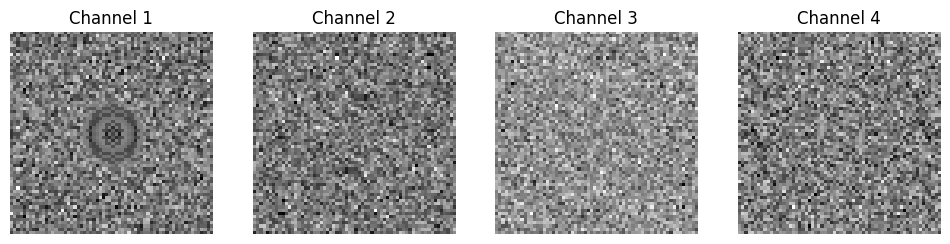

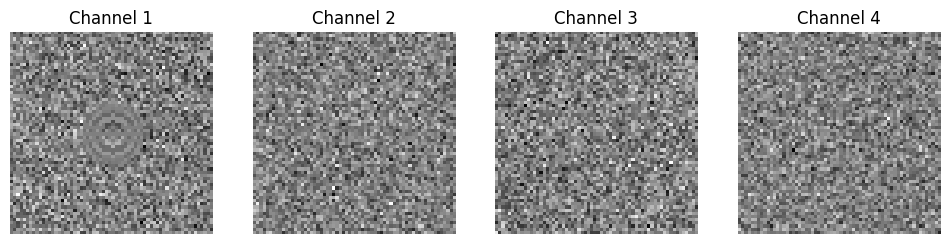

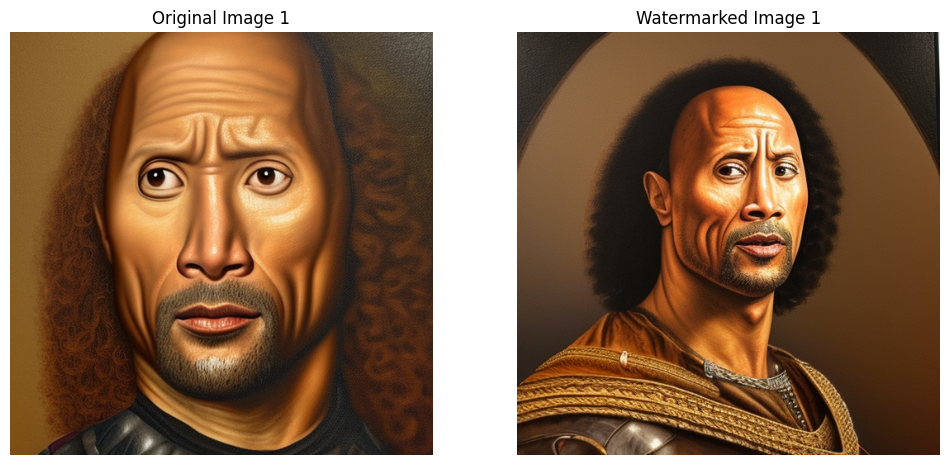

  0%|          | 0/50 [00:00<?, ?it/s]

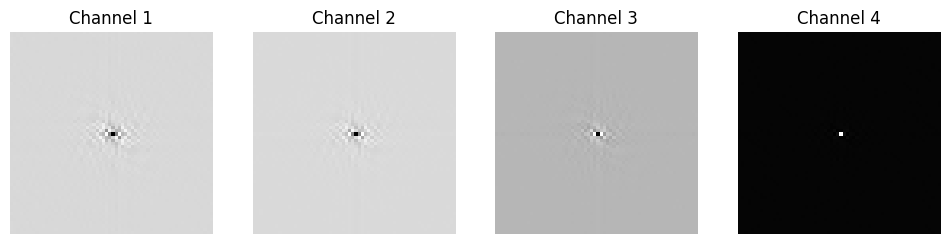

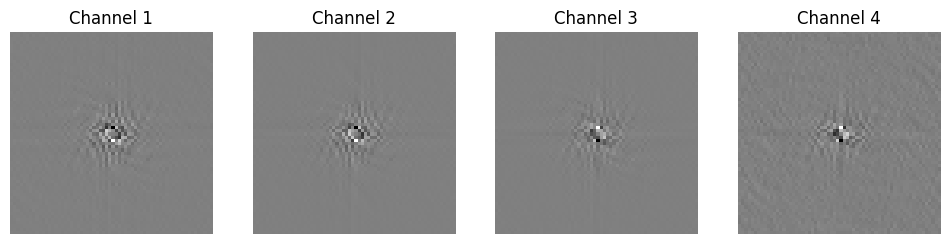

 10%|█         | 1/10 [00:46<06:56, 46.24s/it]

Sample 1/2 processed
Processing prompt 2: portrait of a dancing eagle woman, beautiful blonde haired lakota sioux goddess, intricate, highly detailed art by james jean, ray tracing, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm and greg rutkowski and alphonse mucha, vladimir kush, giger, 8 k 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

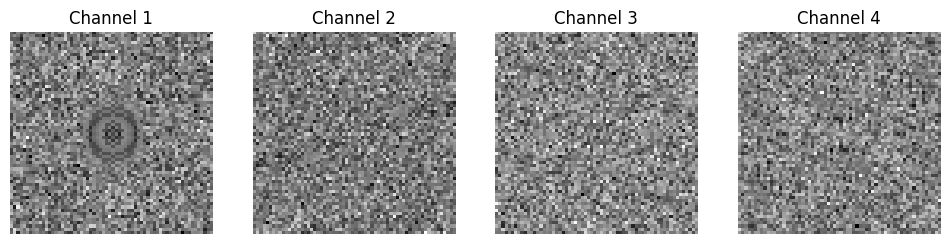

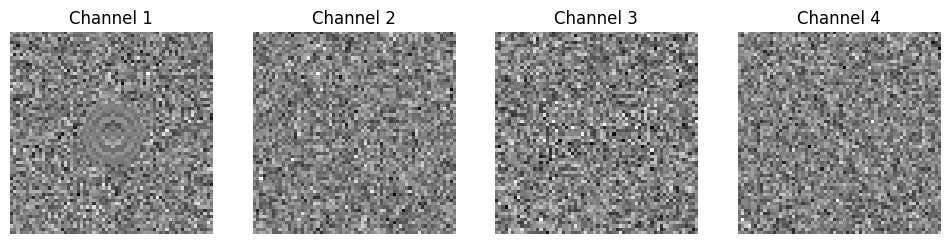

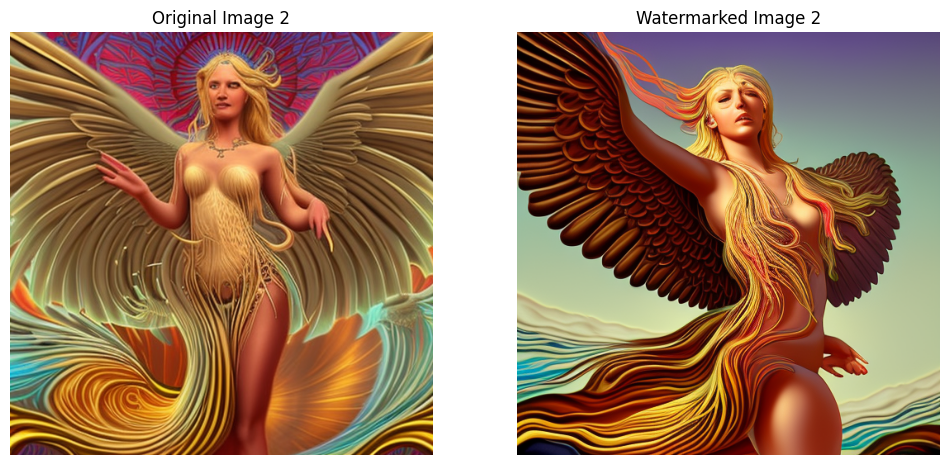

  0%|          | 0/50 [00:00<?, ?it/s]

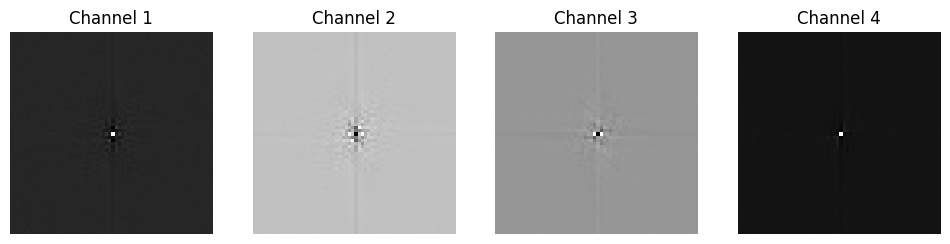

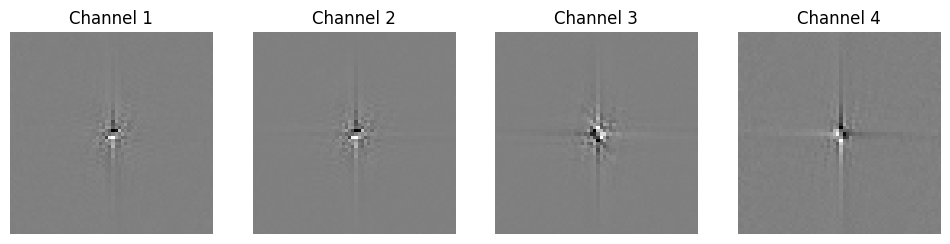

 20%|██        | 2/10 [01:30<06:01, 45.22s/it]

Sample 2/2 processed
Processing prompt 3: epic 3 d, become legend shiji! gpu mecha controlled by telepathic hackers, made of liquid, bubbles, crystals, and mangroves, houdini sidefx, perfect render, artstation trending, by jeremy mann, tsutomi nihei and ilya kuvshinov 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

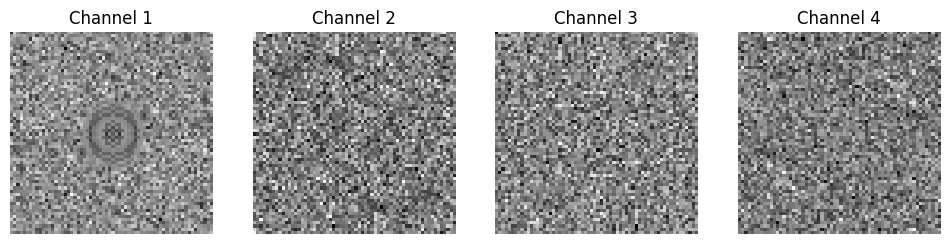

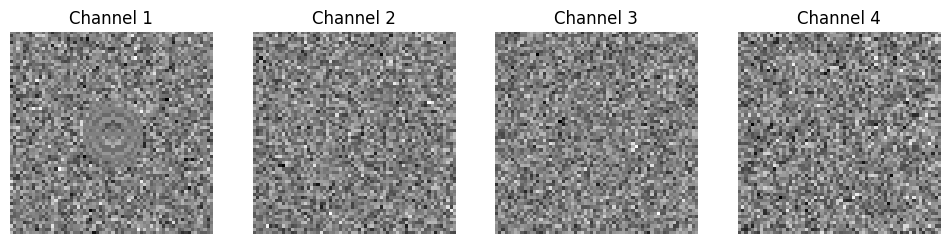

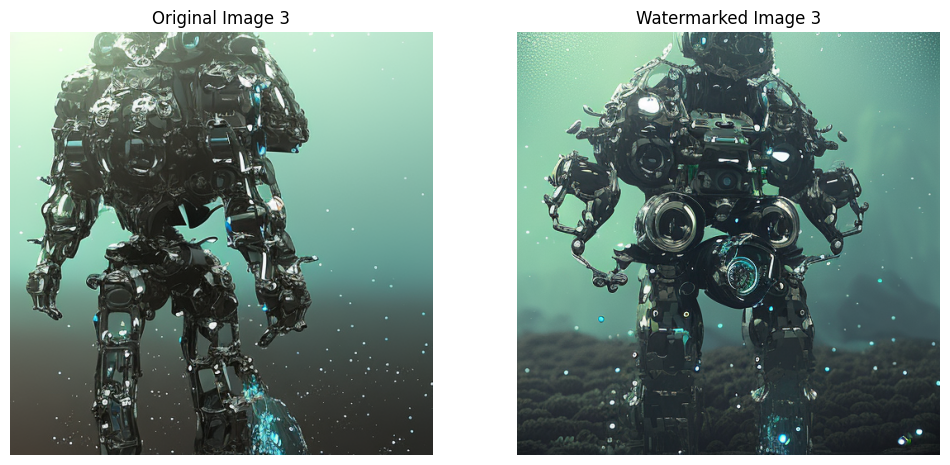

  0%|          | 0/50 [00:00<?, ?it/s]

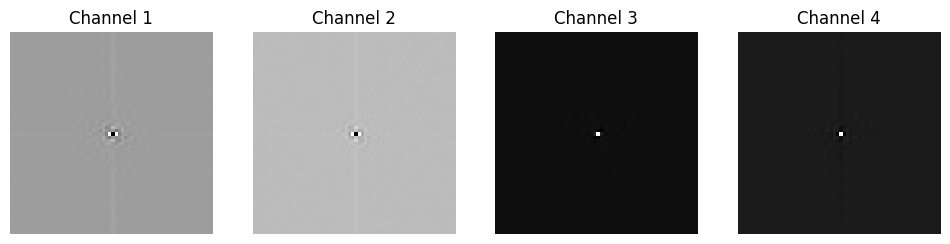

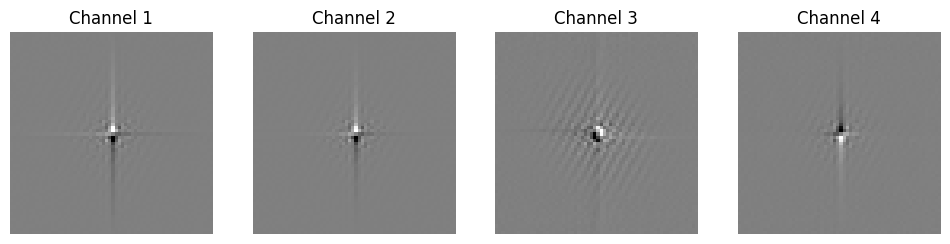

 30%|███       | 3/10 [02:15<05:16, 45.22s/it]

Sample 3/2 processed
Processing prompt 4: an airbrush painting of cyber war machine scene in area 5 1 by destiny womack, gregoire boonzaier, harrison fisher, richard dadd 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

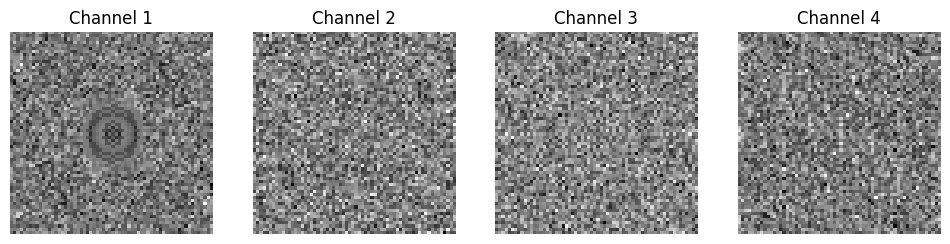

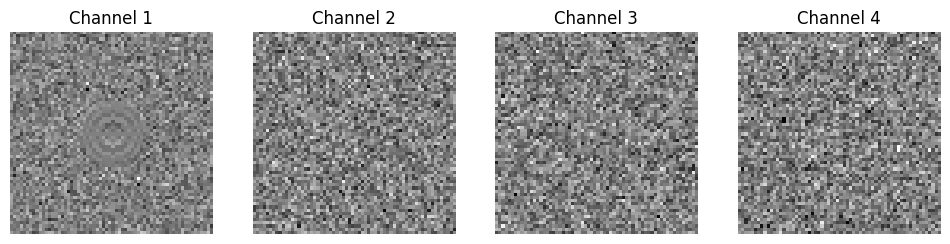

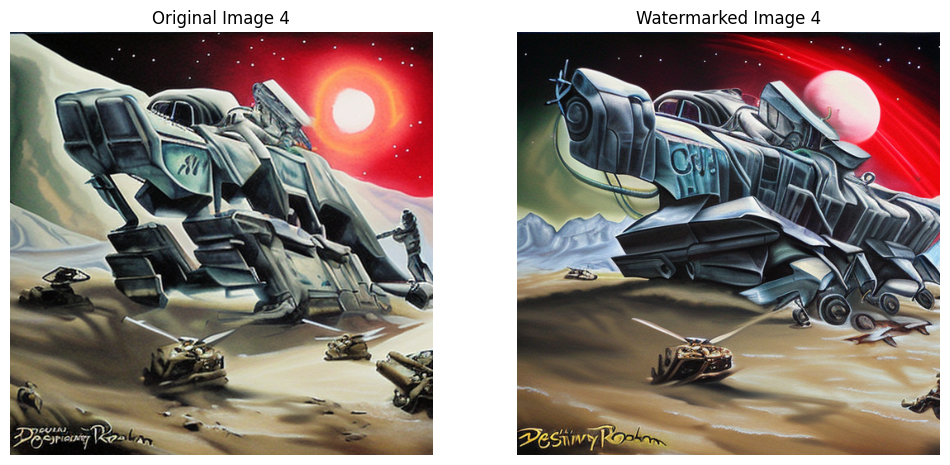

  0%|          | 0/50 [00:00<?, ?it/s]

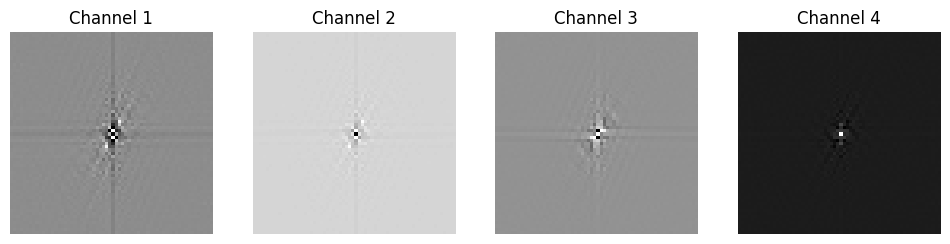

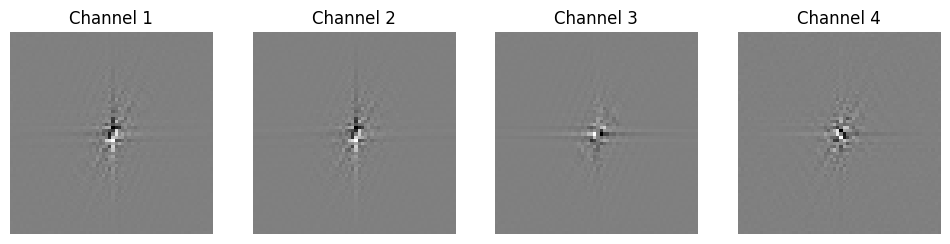

 40%|████      | 4/10 [03:00<04:30, 45.14s/it]

Sample 4/2 processed
Processing prompt 5: concept art of a silent hill monster. painted by edward hopper. 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

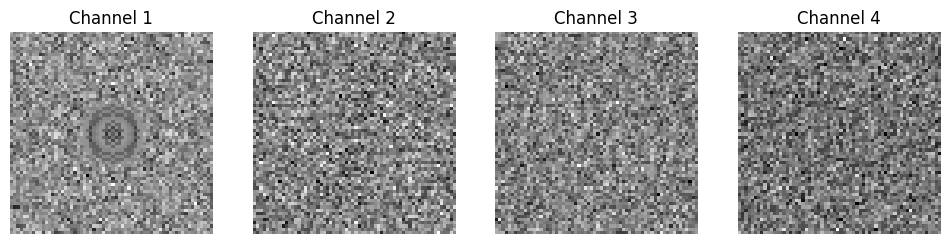

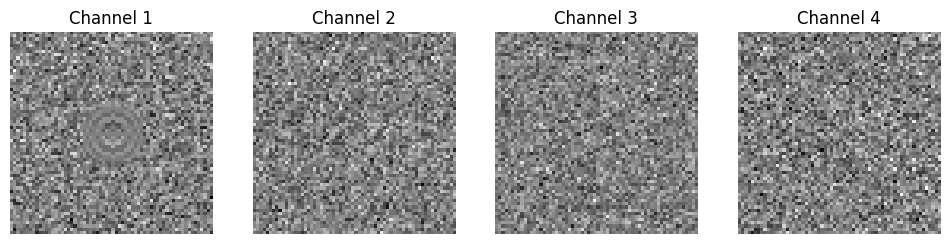

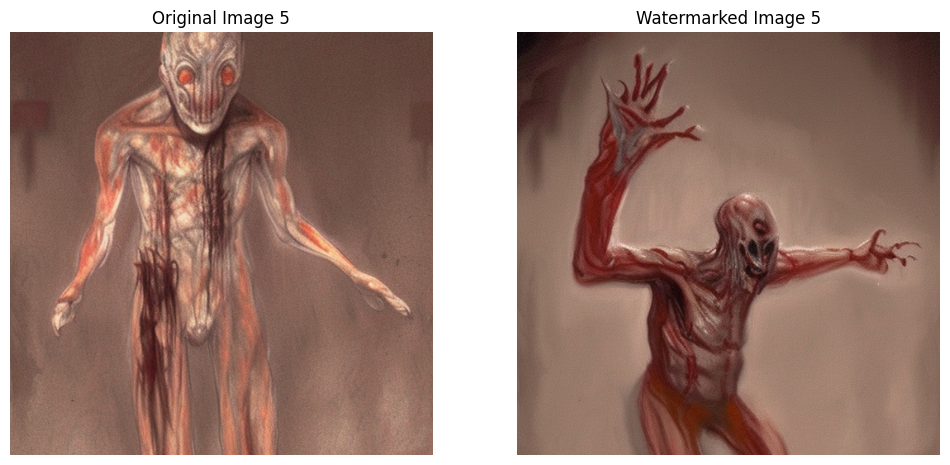

  0%|          | 0/50 [00:00<?, ?it/s]

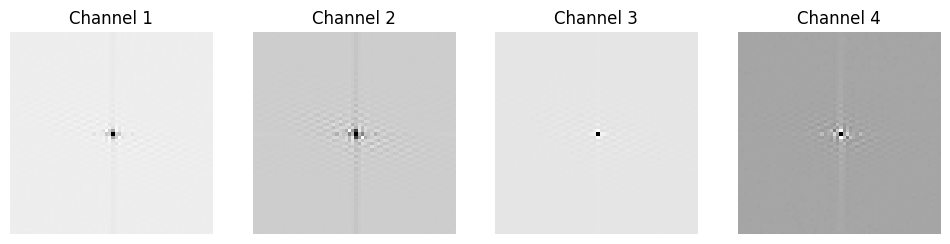

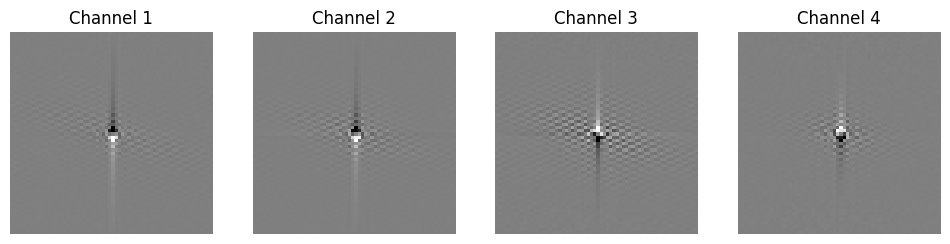

 50%|█████     | 5/10 [03:47<03:47, 45.48s/it]

Sample 5/2 processed
Processing prompt 6: a renaissance portrait of dwayne johnson, art in the style of rembrandt!! intricate. ultra detailed, oil on canvas, wet - on - wet technique, pay attention to facial details, highly realistic, cinematic lightning, intricate textures, illusionistic detail, 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

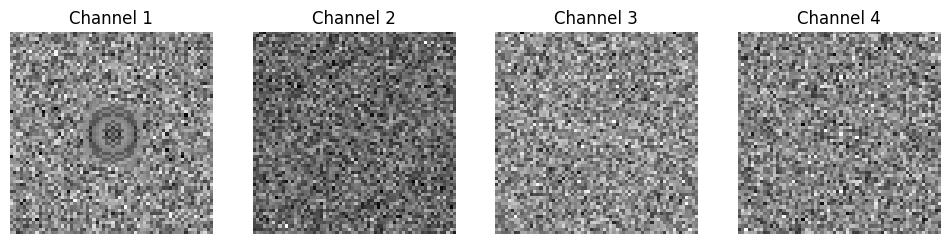

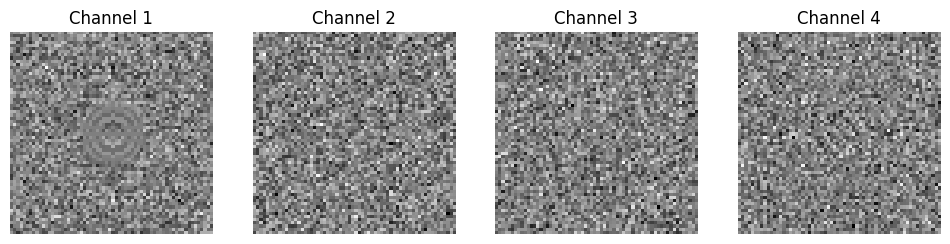

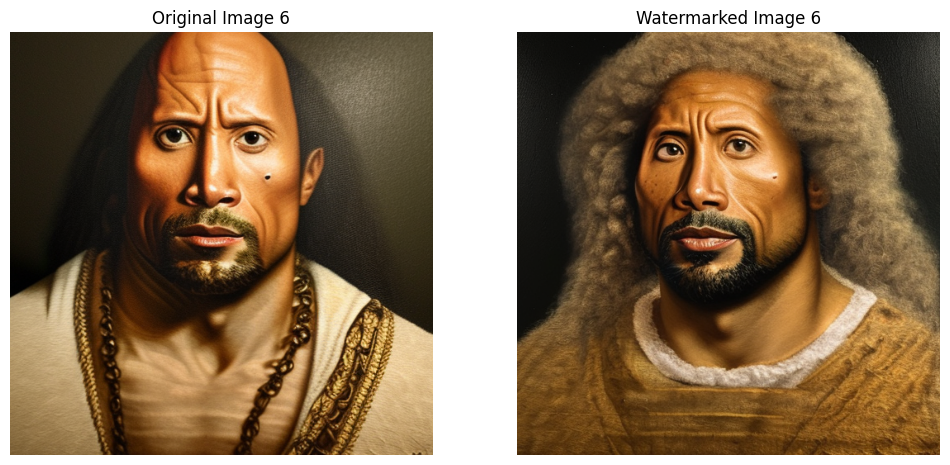

  0%|          | 0/50 [00:00<?, ?it/s]

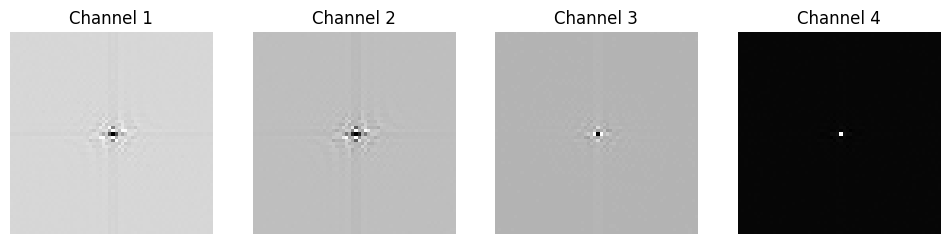

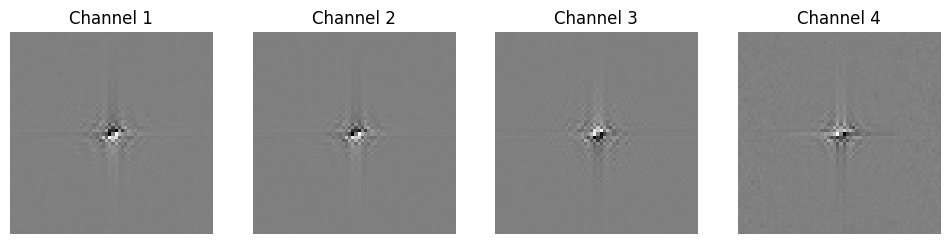

 60%|██████    | 6/10 [04:32<03:02, 45.63s/it]

Sample 6/2 processed
Processing prompt 7: portrait of a dancing eagle woman, beautiful blonde haired lakota sioux goddess, intricate, highly detailed art by james jean, ray tracing, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm and greg rutkowski and alphonse mucha, vladimir kush, giger, roger dean, 8 k 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

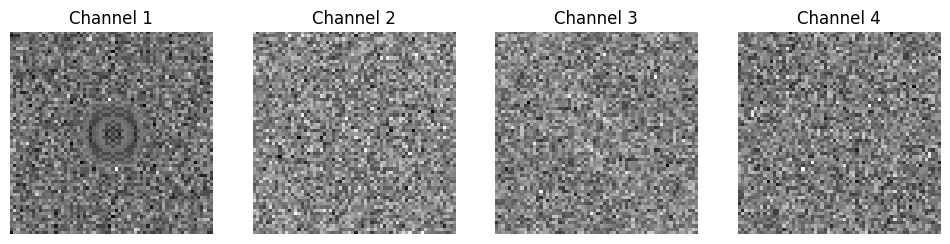

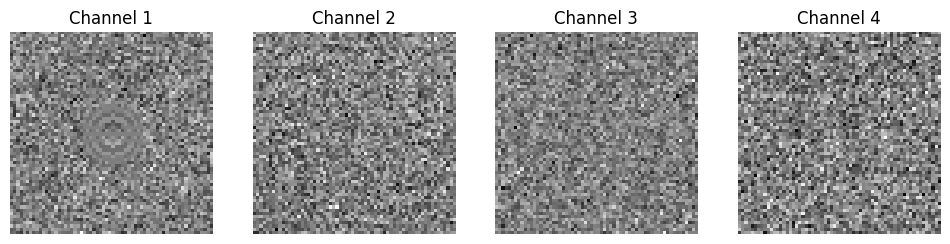

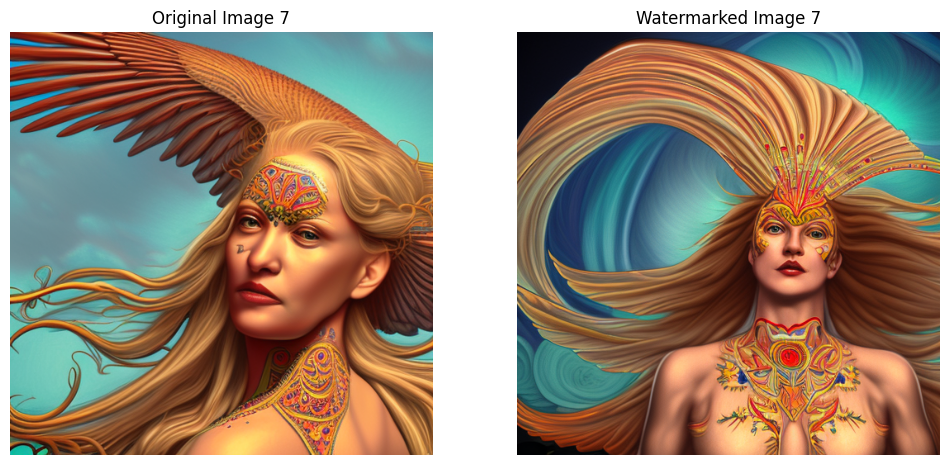

  0%|          | 0/50 [00:00<?, ?it/s]

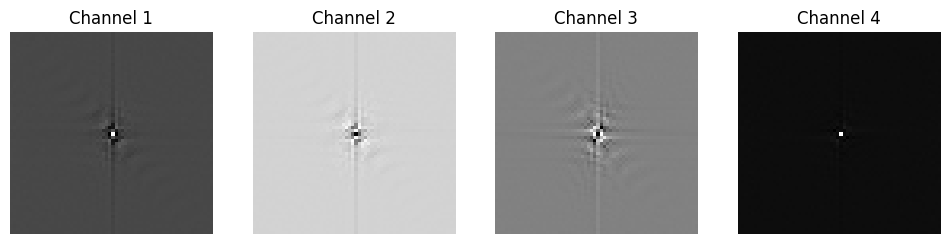

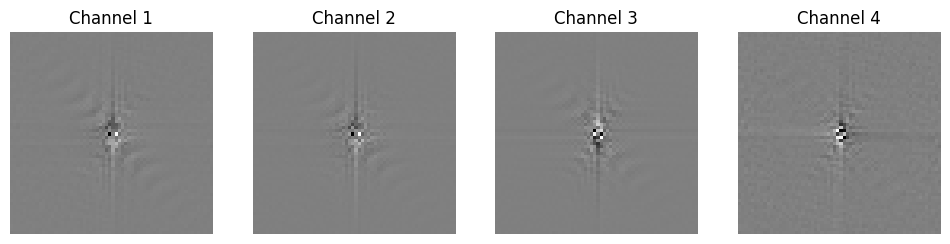

 70%|███████   | 7/10 [05:19<02:17, 45.91s/it]

Sample 7/2 processed
Processing prompt 8: a cigarette with purple tobacco 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

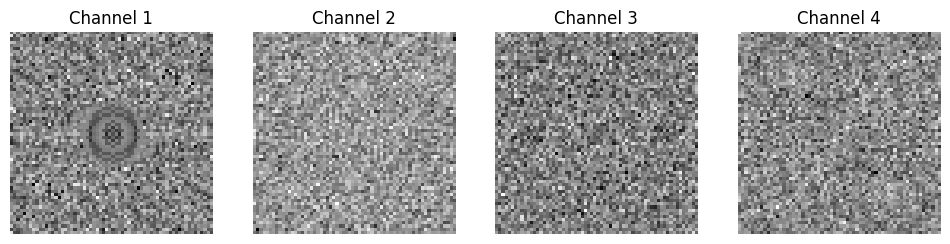

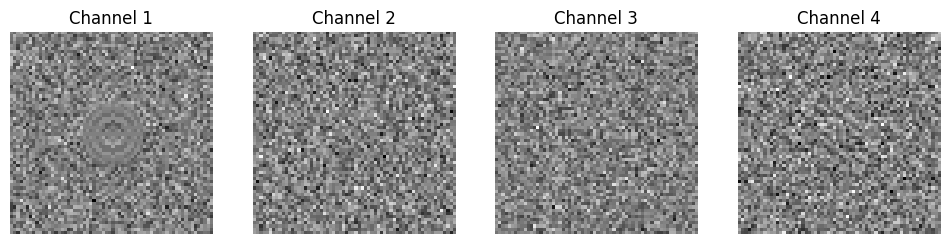

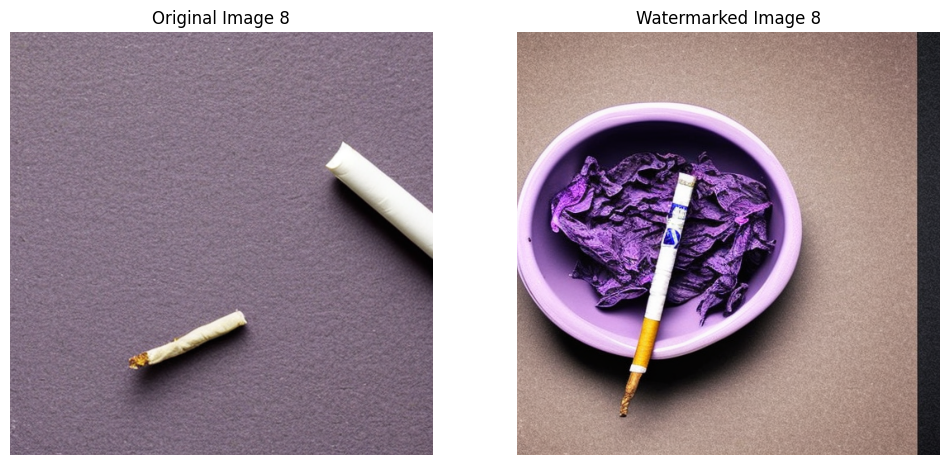

  0%|          | 0/50 [00:00<?, ?it/s]

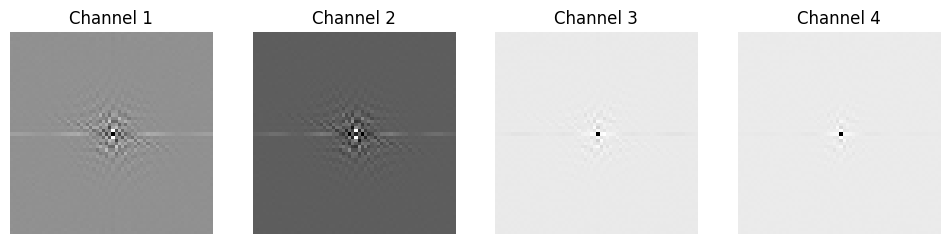

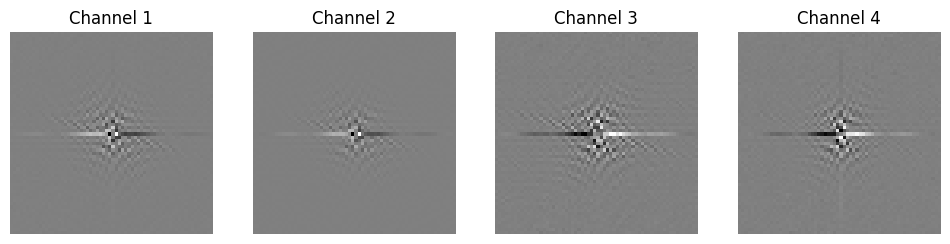

 80%|████████  | 8/10 [06:05<01:32, 46.01s/it]

Sample 8/2 processed
Processing prompt 9: photo of very unappetizing food 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

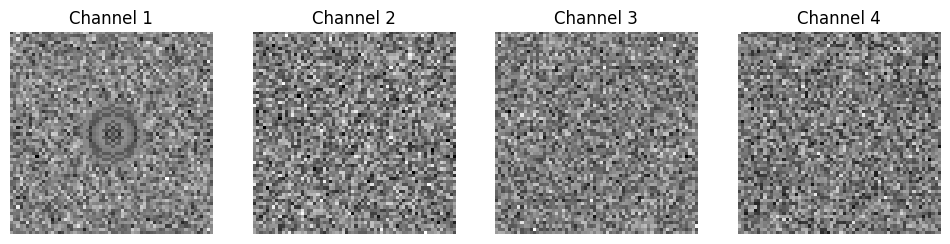

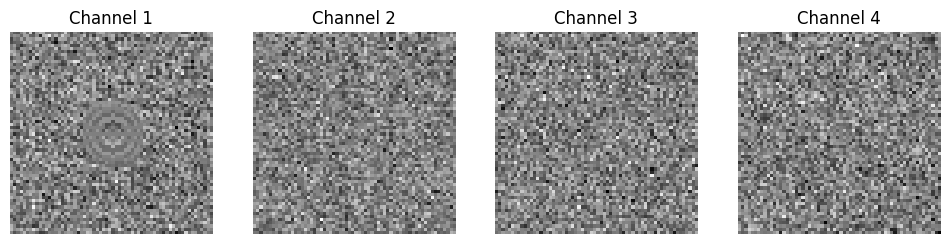

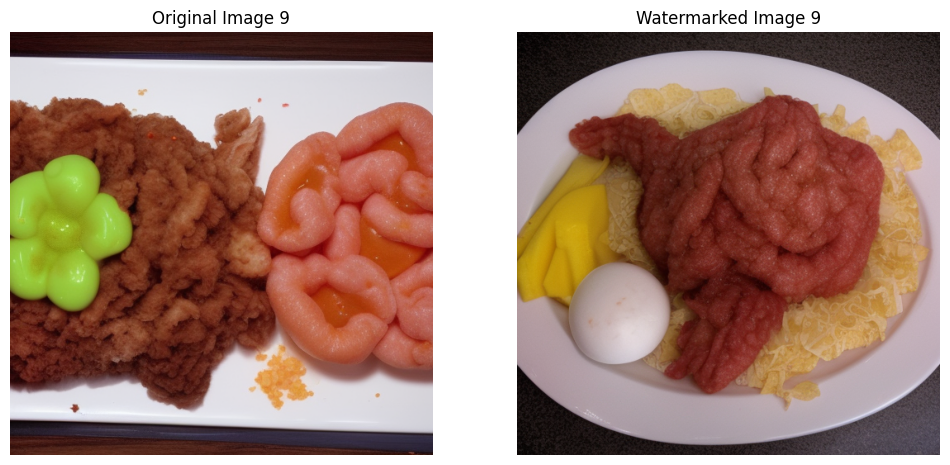

  0%|          | 0/50 [00:00<?, ?it/s]

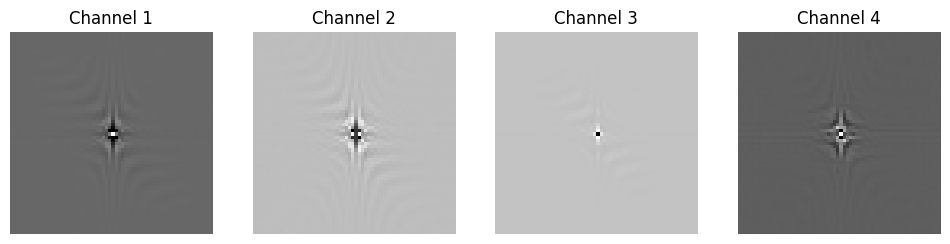

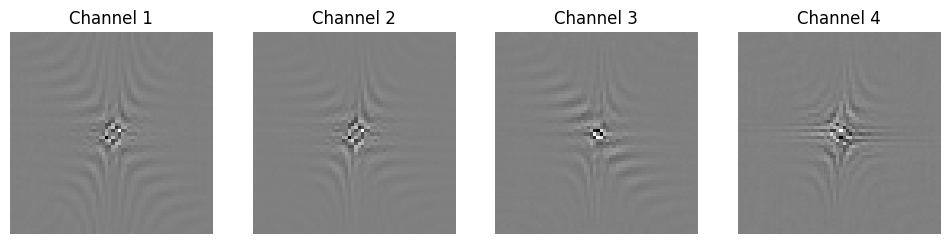

 90%|█████████ | 9/10 [06:51<00:46, 46.02s/it]

Sample 9/2 processed
Processing prompt 10: a renaissance portrait of will ferrell, art in the style of rembrandt!! intricate. ultra detailed, oil on canvas, wet - on - wet technique, pay attention to facial details, highly realistic, cinematic lightning, intricate textures, illusionistic detail, 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

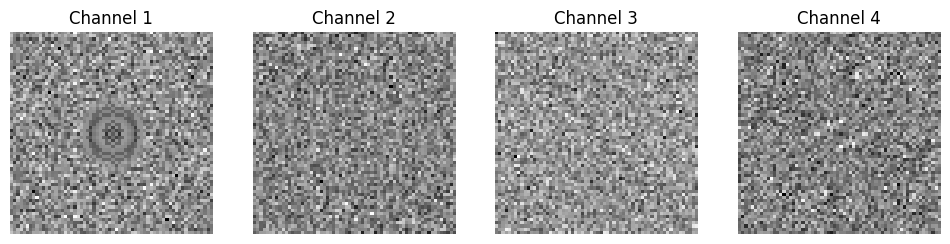

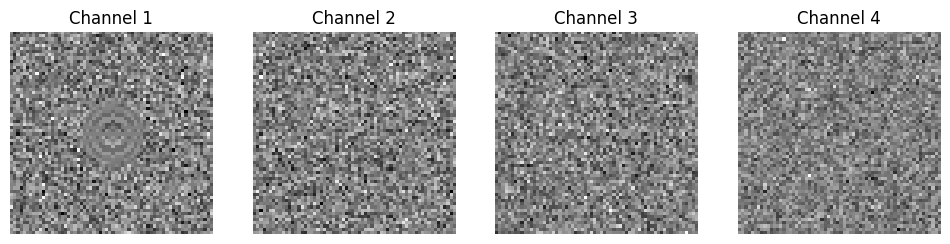

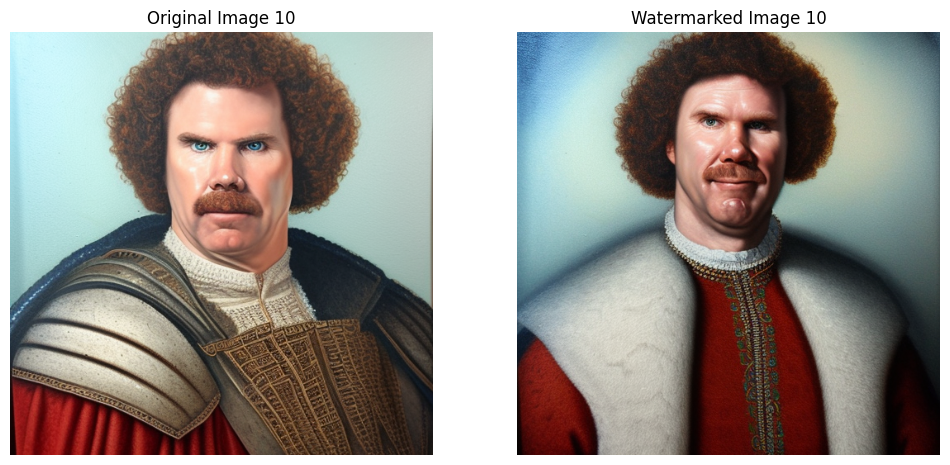

  0%|          | 0/50 [00:00<?, ?it/s]

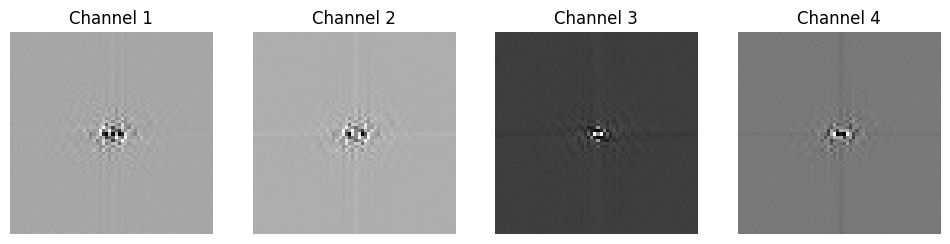

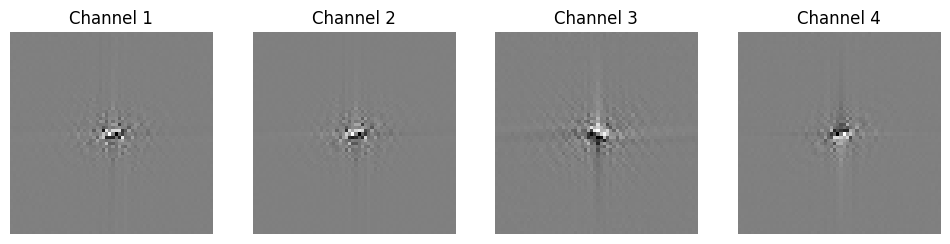

100%|██████████| 10/10 [07:38<00:00, 45.87s/it]

Sample 10/2 processed


In [ ]:
import argparse
import copy
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from datasets import load_dataset
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler
import numpy as np
from sklearn.metrics import roc_curve, auc

def set_random_seed(seed):
    torch.manual_seed(seed)
    np.random.seed(seed)

def circle_mask(size=64, r=10, x_offset=0, y_offset=0):
    x0 = y0 = size // 2
    x0 += x_offset
    y0 += y_offset
    y, x = np.ogrid[:size, :size]
    y = y[::-1]
    return ((x - x0)**2 + (y-y0)**2) <= r**2

def get_watermarking_mask(init_latents_w, args, device):
    watermarking_mask = torch.zeros(init_latents_w.shape, dtype=torch.bool).to(device)
    if args.w_mask_shape == 'circle':
        np_mask = circle_mask(init_latents_w.shape[-1], r=args.w_radius)
        torch_mask = torch.tensor(np_mask).to(device)
        if args.w_channel == -1:
            watermarking_mask[:, :] = torch_mask
        else:
            watermarking_mask[:, args.w_channel] = torch_mask
    elif args.w_mask_shape == 'square':
        anchor_p = init_latents_w.shape[-1] // 2
        if args.w_channel == -1:
            watermarking_mask[:, :, anchor_p-args.w_radius:anchor_p+args.w_radius, anchor_p-args.w_radius:anchor_p+args.w_radius] = True
        else:
            watermarking_mask[:, args.w_channel, anchor_p-args.w_radius:anchor_p+args.w_radius, anchor_p-args.w_radius:anchor_p+args.w_radius] = True
    elif args.w_mask_shape == 'no':
        pass
    return watermarking_mask

def get_watermarking_pattern(pipe, args, device, shape=None):
    set_random_seed(args.w_seed)
    if shape is not None:
        gt_init = torch.randn(*shape, device=device)
    else:
        gt_init = pipe.get_random_latents()

    if 'seed_ring' in args.w_pattern:
        gt_patch = gt_init
        gt_patch_tmp = copy.deepcopy(gt_patch)
        for i in range(args.w_radius, 0, -1):
            tmp_mask = circle_mask(gt_init.shape[-1], r=i)
            tmp_mask = torch.tensor(tmp_mask).to(device)
            for j in range(gt_patch.shape[1]):
                gt_patch[:, j, tmp_mask] = gt_patch_tmp[0, j, 0, i].item()
    elif 'seed_zeros' in args.w_pattern:
        gt_patch = gt_init * 0
    elif 'seed_rand' in args.w_pattern:
        gt_patch = gt_init
    elif 'rand' in args.w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2))
        gt_patch[:] = gt_patch[0]
    elif 'zeros' in args.w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2)) * 0
    elif 'const' in args.w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2)) * 0
        gt_patch += args.w_pattern_const
    elif 'ring' in args.w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2))
        gt_patch_tmp = copy.deepcopy(gt_patch)
        for i in range(args.w_radius, 0, -1):
            tmp_mask = circle_mask(gt_init.shape[-1], r=i)
            tmp_mask = torch.tensor(tmp_mask).to(device)
            for j in range(gt_patch.shape[1]):
                gt_patch[:, j, tmp_mask] = gt_patch_tmp[0, j, 0, i].item()
    return gt_patch

def inject_watermark(init_latents_w, watermarking_mask, gt_patch, args):
    init_latents_w_fft = torch.fft.fftshift(torch.fft.fft2(init_latents_w), dim=(-1, -2))
    if args.w_injection == 'complex':
        init_latents_w_fft[watermarking_mask] = gt_patch[watermarking_mask].clone()
    elif args.w_injection == 'seed':
        init_latents_w[watermarking_mask] = gt_patch[watermarking_mask].clone()
        return init_latents_w
    init_latents_w = torch.fft.ifft2(torch.fft.ifftshift(init_latents_w_fft, dim=(-1, -2))).real
    return init_latents_w

def visualize_tensor(tensor, name='./tmp.png'):
    channels = tensor.squeeze(0).cpu().numpy()
    fig, axs = plt.subplots(1, 4, figsize=(12, 3))
    for i, ax in enumerate(axs):
        ax.imshow(channels[i], cmap='gray')
        ax.set_title(f'Channel {i+1}')
        ax.axis('off')
    plt.savefig(name)
    plt.show()



diffusion_db = load_dataset('poloclub/diffusiondb', '2m_first_5k', trust_remote_code=True)
prompts = diffusion_db['train']['prompt']

model_id = 'stabilityai/stable-diffusion-2-1-base'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

scheduler = DPMSolverMultistepScheduler.from_pretrained(model_id, subfolder='scheduler')
pipe = DiffusionPipeline.from_pretrained(model_id, scheduler=scheduler, torch_dtype=torch.float16)
pipe = pipe.to(torch.float32)
pipe = pipe.to(device)

args = argparse.Namespace(
    w_mask_shape='circle',
    w_radius=10,
    w_channel=0,
    w_pattern='ring',
    w_seed=42,
    w_injection='complex',
    num_images=1,
    guidance_scale=7.5,
    num_inference_steps=50,
    image_length=512,
    test_num_inference_steps=50,
    start=0,
    end=10
)

shape = (1, 4, 64, 64)
gt_patch = get_watermarking_pattern(pipe, args, device, shape)

watermarked_scores = []
clean_scores = []
y_true = []

n_samples = 2
for i in tqdm(range(args.start, args.end)):
    seed = i + 42
    current_prompt = prompts[i]

    print(f"Processing prompt {i+1}: {current_prompt}")

    # Generation without watermarking
    set_random_seed(seed)
    init_latents_no_w = torch.randn(shape, device=device)
    with torch.autocast("cuda"):
        outputs_no_w = pipe(
            current_prompt,
            num_images_per_prompt=args.num_images,
            guidance_scale=args.guidance_scale,
            num_inference_steps=args.num_inference_steps,
            height=args.image_length,
            width=args.image_length,
            latents=init_latents_no_w,
        )
    orig_image_no_w = outputs_no_w.images[0]

    # Generation with watermarking
    init_latents_w = init_latents_no_w.clone()
    watermarking_mask = get_watermarking_mask(init_latents_w, args, device)
    init_latents_w = inject_watermark(init_latents_w, watermarking_mask, gt_patch, args)

    outputs_w = pipe(
        current_prompt,
        num_images_per_prompt=args.num_images,
        guidance_scale=args.guidance_scale,
        num_inference_steps=args.num_inference_steps,
        height=args.image_length,
        width=args.image_length,
        latents=init_latents_w,
    )
    orig_image_w = outputs_w.images[0]

    orig_image_no_w.save(f'original_image_{i}.png')
    orig_image_w.save(f'watermarked_image_{i}.png')

    init_latents_w_fft_real = torch.fft.fftshift(torch.fft.fft2(init_latents_w), dim=(-1, -2)).real
    visualize_tensor(init_latents_w_fft_real, name=f'./real_{i}.png')
    init_latents_w_fft_imag = torch.fft.fftshift(torch.fft.fft2(init_latents_w), dim=(-1, -2)).imag
    visualize_tensor(init_latents_w_fft_imag, name=f'./imag_{i}.png')

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    ax1.imshow(orig_image_no_w)
    ax1.set_title(f'Original Image {i+1}')
    ax1.axis('off')

    ax2.imshow(orig_image_w)
    ax2.set_title(f'Watermarked Image {i+1}')
    ax2.axis('off')

    plt.savefig(f'comparison_{i}.png')
    plt.show() 


    img_w = _transform_img(orig_image_w).unsqueeze(0).to(pipe.unet.dtype).to(device)
    image_latents_w = pipe.vae.encode(img_w).latent_dist.mode() * 0.18215

    reversed_latents_w = pipe(
        prompt='',
        latents=image_latents_w,
        guidance_scale=1,
        num_inference_steps=args.test_num_inference_steps,
        output_type='latent',
    ).images.float().cpu()

    init_latents_w_fft_real = torch.fft.fftshift(torch.fft.fft2(reversed_latents_w), dim=(-1, -2)).real
    visualize_tensor(init_latents_w_fft_real, name='./real.png')

    init_latents_w_fft_imag = torch.fft.fftshift(torch.fft.fft2(reversed_latents_w), dim=(-1, -2)).imag
    visualize_tensor(init_latents_w_fft_imag, name='./imag.png')

    print(f'Sample {i+1}/{n_samples} processed')



In [19]:
print("For the Det-IGEN model with pattern of the watermark as a ring:\n\n")

print("---------------- TASK 1: DETECTING AI-GENERATED IMAGES --------------\n")
print("Here, we evaluate the performance of our detecting approach on a mix of generated images, both with and without the watermark:")
print(f"Accuracy: {acc_gen}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {2 * (precision * recall) / (precision + recall)}\n")

tn_irl, fp_irl = 100-sum2, sum2

acc_irl = (tp_wmk_wmk+tn_irl)/(tp_wmk_wmk+fn_nwmk_wmk+tn_irl+fp_irl)
rec_irl = tp_wmk_wmk/(tp_wmk_wmk+fn_nwmk_wmk)
prec_irl = tp_wmk_wmk/(tp_wmk_wmk+fp_irl)

print("---------------- TASK 2: REAL-WORLD IMAGE CLASSIFICATION --------------\n")
print("Here, we record our detecting approach on a mix of watermark-generated images and real-world images (a real-world classification case):")
print(f"Accuracy: {acc_irl}")
print(f"Precision: {prec_irl}")
print(f"Recall: {rec_irl}")
print(f"F1 Score: {2 * (prec_irl * rec_irl) / (prec_irl + rec_irl)}\n")


For the Det-IGEN model with pattern of the watermark as a ring


---------------- TASK 1: DETECTING AI-GENERATED IMAGES --------------

Here, we evaluate the performance of our detecting approach on a mix of generated images, both with and without the watermark:
Accuracy: 0.965
Precision: 0.9345794392523364
Recall: 1.0
F1 Score: 0.966183574879227

---------------- TASK 2: REAL-WORLD IMAGE CLASSIFICATION --------------

Here, we record our detecting approach on a mix of watermark-generated images and real-world images (a real-world classification case):
Accuracy: 0.98
Precision: 0.9615384615384616
Recall: 1.0
F1 Score: 0.9803921568627451

